In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline
#%matplotlib interactive

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
from src.data.data_loader import load_all_data

df_raw = load_all_data()

In [5]:
df_raw = df_raw.drop_duplicates(subset=['func_documentation'])

In [210]:
import numpy as np
X = np.stack(df_raw["g_max_reps"])

# Dimensionality reduction

In [211]:
cache_dir = "../.data/cache"

In [213]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

pipeline = Pipeline([
#    ('scaling', StandardScaler()),
    ('pca', PCA(n_components=50, random_state=42)),
    ('tsne', TSNE(n_components=2, verbose=2, random_state=42, perplexity=25, n_iter=5000))
    ], memory=cache_dir, verbose=True)

pipeline.fit(X)

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 4474 samples in 0.000s...
[t-SNE] Computed neighbors for 4474 samples in 0.072s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4474
[t-SNE] Computed conditional probabilities for sample 2000 / 4474
[t-SNE] Computed conditional probabilities for sample 3000 / 4474
[t-SNE] Computed conditional probabilities for sample 4000 / 4474
[t-SNE] Computed conditional probabilities for sample 4474 / 4474
[t-SNE] Mean sigma: 8.412888
[t-SNE] Computed conditional probabilities in 0.052s
[t-SNE] Iteration 50: error = 81.0955276, gradient norm = 0.0221774 (50 iterations in 0.780s)
[t-SNE] Iteration 100: error = 77.2483749, gradient norm = 0.0034848 (50 iterations in 0.500s)
[t-SNE] Iteration 150: error = 76.6730347, gradient norm = 0.0007129 (50 iterations in 0.514s)
[t-SNE] Iteration 200: error = 76.5609970, gradient norm = 0.0001496 (50 iterations in 0.545s)
[t-SNE] Iteration 250: error = 76.5368042, gradient norm = 0.0000561

Pipeline(memory='../.data/cache',
         steps=[('pca', PCA(n_components=50, random_state=42)),
                ('tsne',
                 TSNE(n_iter=5000, perplexity=25, random_state=42, verbose=2))],
         verbose=True)

In [214]:
#get values from pipeline:
pca = pipeline.named_steps['pca']
pca_data = pca.transform(X)
pca_data

array([[-2.40165555e+01,  3.63592685e+00,  1.87252478e+01, ...,
        -1.32318895e+00, -5.02603434e+00,  2.66160145e+00],
       [-2.32467388e+01,  2.47762351e+00,  1.86463324e+01, ...,
        -4.20696181e-01, -5.12058171e+00,  3.08333941e+00],
       [ 6.72415910e+01,  1.48406525e+01, -1.26927051e+00, ...,
        -4.16465678e-01, -1.16790601e+00,  2.32822292e+00],
       ...,
       [ 5.45135764e+00, -8.54692134e+00, -6.59978006e+00, ...,
        -6.07588345e-01, -5.52910867e-02, -4.26680341e-01],
       [ 6.85145967e+01, -1.08319688e+00,  1.99554740e+00, ...,
         3.12368687e-02, -9.49960382e-01, -5.63190353e-01],
       [-2.05480263e+00, -3.24184905e+00, -1.91885836e+00, ...,
         3.72815403e-01,  1.16537924e+00, -6.62195585e-01]])

Text(0.5, 1.0, 'PCA')

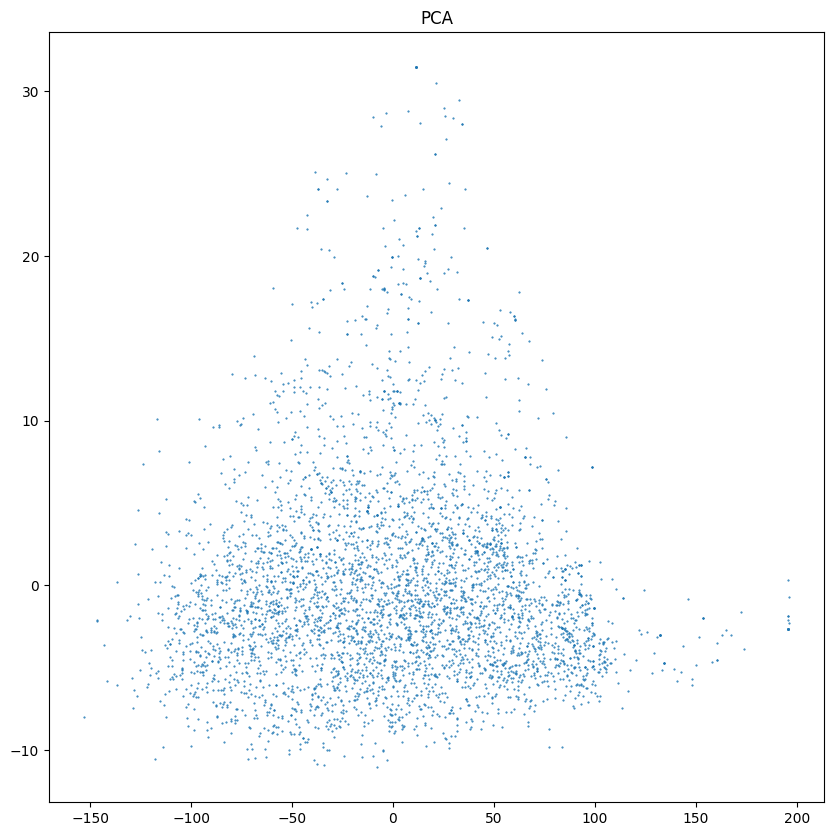

In [215]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure( figsize=(10, 10),)

ax = fig.gca()


ax.scatter( x=pca_data[:,0], y=pca_data[:,1], alpha=1, marker='.', s=1)
ax.set_title('PCA')

In [216]:
#import numpy as np
#from torch.utils.tensorboard import SummaryWriter
#
#vectors = X
#metadata = df["func_documentation"].values # labels
#writer = SummaryWriter()
#writer.add_embedding(vectors, metadata)
#writer.close()

In [217]:
tsne = pipeline.named_steps['tsne']
tsne_data = tsne.embedding_
tsne_data

array([[-46.992504 ,  68.08836  ],
       [-46.763737 ,  68.06869  ],
       [107.637024 ,  33.971962 ],
       ...,
       [ 13.273241 , -29.967485 ],
       [104.02645  ,  16.521639 ],
       [ -1.2042892, -15.128917 ]], dtype=float32)

Text(0.5, 1.0, 'T-SNE + PCA')

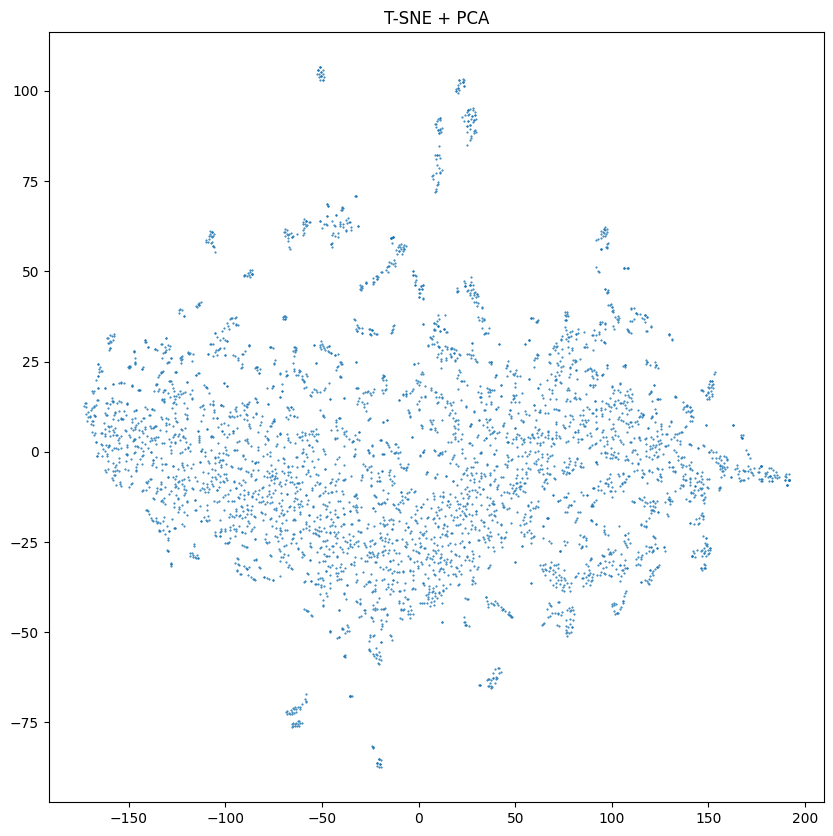

In [218]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure( figsize=(10, 10),)

ax = fig.gca()


ax.scatter( x=tsne_data[:,0], y=tsne_data[:,1], alpha=1, marker='.', s=1)
ax.set_title('T-SNE + PCA')


# Clustering

In [219]:
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import product
import matplotlib.gridspec as gridspec

plot_kwds = {'alpha': 1, 'marker': '.', 's': 10, 'linewidths': 0}

def plot_clusters(data, algorithm, hyperparameters, sort_by_cluster_size=False, num_cols=1, scale=6, args=()):
    param_names = list(hyperparameters.keys())
    num_params = len(param_names)
    combinations = list(product(*hyperparameters.values()))
    num_combinations = len(combinations)
    
    if sort_by_cluster_size:
        cluster_sizes = []  # List to store cluster sizes
        
        for i, param_values in enumerate(combinations):
            params = dict(zip(param_names, param_values))
            labels = algorithm(**params).fit_predict(data)
            num_clusters = len(np.unique(labels))
            cluster_sizes.append(num_clusters)
        
        # Sort combinations and cluster sizes in descending order of cluster sizes
        sorted_indices = np.argsort(cluster_sizes)[::-1]
        sorted_combinations = [combinations[i] for i in sorted_indices]
    else:
        sorted_combinations = combinations

    num_rows = (num_combinations + num_cols - 1) // num_cols  # Calculate the number of rows needed
    
    # Calculate the figure size based on the number of rows and columns
    fig_width = scale * num_cols
    fig_height = scale * num_rows
    
    fig = plt.figure(figsize=(fig_width, fig_height))
    #fig.suptitle(f'{algorithm.__name__} - Hyperparameter Grid')
    
    gs = gridspec.GridSpec(num_rows, num_cols, figure=fig)  # Use GridSpec to define the grid
    
    for i, param_values in enumerate(sorted_combinations):
        params = dict(zip(param_names, param_values))
        start_time = time.time()
        labels = algorithm(*args, **params).fit_predict(data)
        end_time = time.time()
        
        num_clusters = len(np.unique(labels))

        palette = sns.color_palette('deep', num_clusters)
        colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
        
        ax = fig.add_subplot(gs[i // num_cols, i % num_cols])  # Use GridSpec to position the subplot
        ax.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
        ax.set_title(f'Hyperparameters: {params}')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')

        # add total number of clusters
        ax.text(
            0.97,
            0.06,
            f'Clusters: {num_clusters}',
            verticalalignment='bottom',
            horizontalalignment='right',
            transform=ax.transAxes,
            fontsize=8,
        )

        ax.text(
            0.97,
            0.02,
            f'Clustering took: {end_time - start_time:.2f}s',
            verticalalignment='bottom',
            horizontalalignment='right',
            transform=ax.transAxes,
            fontsize=8,
        )
    
    plt.tight_layout()
    plt.show()


## Parameter Search

### DBSCAN

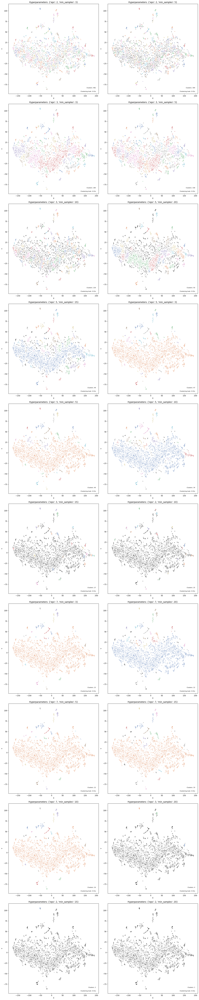

In [220]:
from sklearn.cluster import DBSCAN

# Example usage
algorithm = DBSCAN  # Clustering algorithm

hyperparameters = {
    #'eps': [20, 50, 100],  # Hyperparameter 1
    'eps': [2,3, 5, 7],  # Hyperparameter 1
    #'min_samples': [5, 10, 20],  # Hyperparameter 2
    'min_samples': [3, 5, 10, 20, 15],  # Hyperparameter 2
   # 'leaf_size': [10, 20],  # Hyperparameter 3
}

plot_clusters(pipeline.named_steps['tsne'].embedding_, algorithm, hyperparameters, num_cols=2, scale=8, sort_by_cluster_size=True)


### HDBSCAN

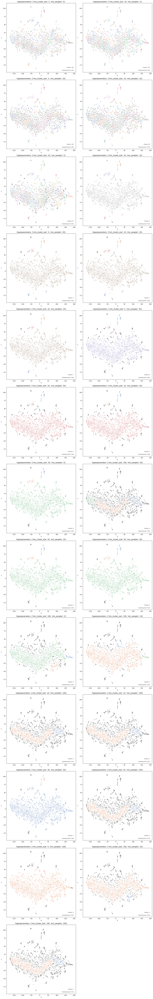

In [221]:
from hdbscan import HDBSCAN
algorithm = HDBSCAN  # Example clustering algorithm

hyperparameters = {
    'min_cluster_size': [5, 10, 20, 50, 100],  # Hyperparameter 1
    'min_samples': [5, 10, 20, 50, 100],  # Hyperparameter 2
}

plot_clusters(pipeline.named_steps['tsne'].embedding_, algorithm, hyperparameters, num_cols=2, scale=8, sort_by_cluster_size=True)


### KMeans

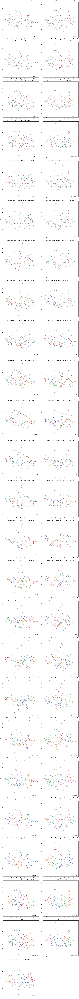

In [222]:
from sklearn.cluster import KMeans
algorithm = KMeans  # Clustering algorithm

hyperparameters = {
    'n_clusters': [5, 10, 20, 50, 100, 250, 500],  # Hyperparameter 1
    'max_iter': [5, 10, 20, 50, 100, 250, 500],  # Hyperparameter 2
    'n_init': ["auto"]
}

plot_clusters(pipeline.named_steps['tsne'].embedding_, algorithm, hyperparameters, num_cols=2, scale=8, sort_by_cluster_size=True)


## Main clustering

In [223]:
from sklearn.cluster import DBSCAN

# cluster each parent cluster

parent = DBSCAN(eps=3, min_samples=5)

parent_labels = parent.fit_predict(pipeline.named_steps['tsne'].embedding_)

In [224]:
df_raw.index

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            1121, 1127, 1134, 1144, 1152, 1156, 1157, 1164, 1174, 1185],
           dtype='int64', length=4474)

In [225]:
import pandas as pd
index = pd.Index(df_raw.index, name='index')
df = pd.DataFrame(pipeline.named_steps['tsne'].embedding_, columns=['x', 'y'], index=df_raw.index,)
df['cluster'] = parent_labels
clusters = df.groupby('cluster', as_index=False, group_keys=True)


In [226]:
def cluster_sub_clusters(cluster):
    if cluster.name == -1:
        print("Skipping noise cluster")
        cluster["sub_cluster"] = -1
        return cluster

    #if cluster.name == -1:
    #    print("Skipping noise cluster")
    #    return
    
    algorithm = DBSCAN(eps=2, min_samples=5)
    sub_clusters = algorithm.fit(cluster[['x','y']].to_numpy())
    cluster["sub_cluster"] = sub_clusters.labels_.tolist()
    return cluster

clusters = clusters.apply(cluster_sub_clusters)

clusters



Skipping noise cluster


x          y  cluster  sub_cluster
0   11     24.830877 -40.694092       -1           -1
    13    162.699738   7.467884       -1           -1
    15    103.714546 -20.524841       -1           -1
    38    -99.206802  18.243862       -1           -1
    40    162.699738   7.467884       -1           -1
...              ...        ...      ...          ...
157 1     106.636421  24.093769      156            0
    296   106.636421  24.093769      156            0
    633   106.636421  24.093769      156            0
    917   106.716118  23.448757      156            0
    1085  105.586555  23.897934      156            0

[4474 rows x 4 columns]

In [227]:
clusters = clusters.reset_index(level=0, drop=True)


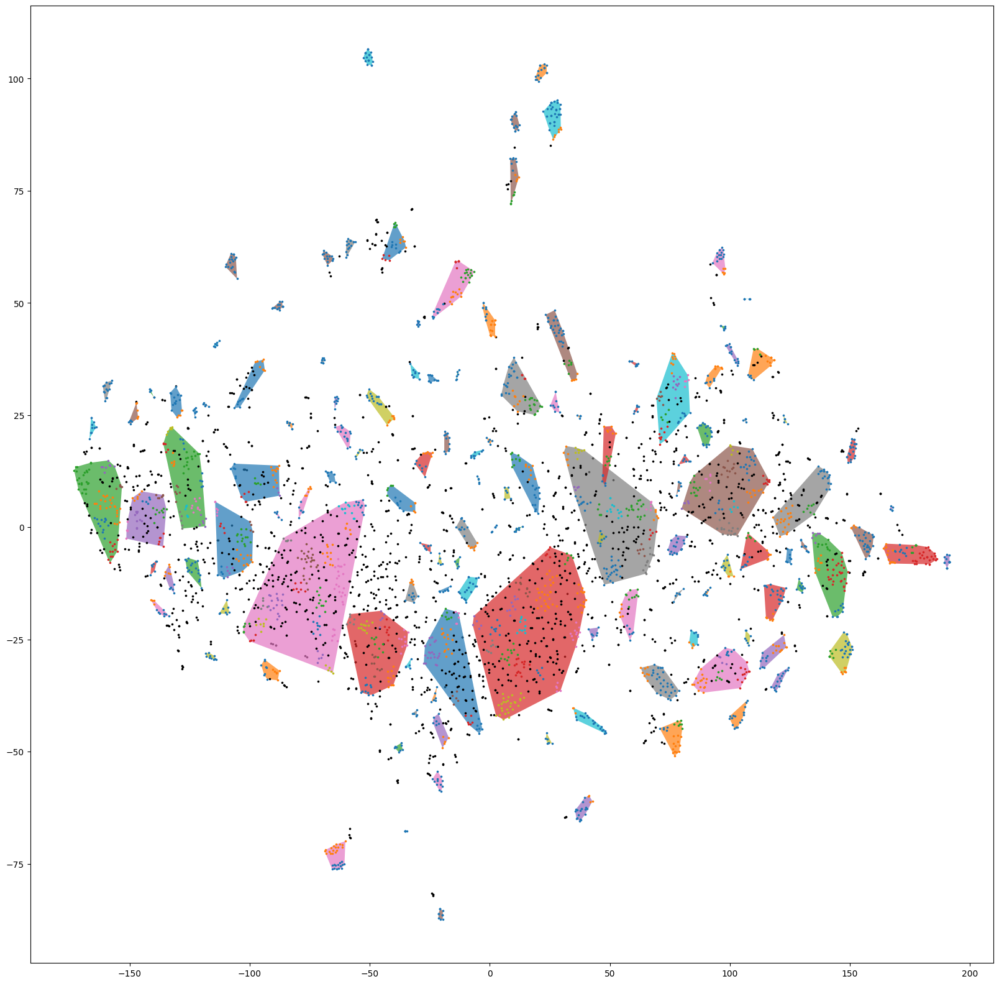

In [228]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull


fig, ax = plt.subplots(figsize=(20, 20))

# make kde plot for each cluster
i = 0
for label, cluster in clusters.groupby('cluster'):
    #if len(cluster) > 100:
    #    continue

    #if i > 15:
    #    break

    if label != -1:
        #sns.kdeplot(data=cluster, x='x', y='y', fill=True, ax=ax, label=label, alpha=0.7, warn_singular=False, thresh=0.005, levels=2)
        filtered = cluster[cluster['sub_cluster'] > -1]
        if filtered.empty:
            continue
        hull = ConvexHull(filtered[['x', 'y']].to_numpy(), qhull_options='QJ')
        ax.fill(filtered['x'].iloc[hull.vertices], filtered['y'].iloc[hull.vertices], alpha=0.7)


        # Generate a unique color for each sub-cluster
        num_sub_clusters = len(cluster.groupby('sub_cluster'))
        colors = sns.color_palette('tab10', n_colors=num_sub_clusters)

    for sub_label, sub_cluster in cluster.groupby('sub_cluster'):
        if sub_label != -1:
            # Scatter plot for each sub-cluster with its corresponding color
            ax.scatter(sub_cluster['x'], sub_cluster['y'], color=colors[sub_label], label=sub_label, alpha=1, marker='.', s=10)
        else:
            ax.scatter(sub_cluster['x'], sub_cluster['y'], color='black', label=sub_label, alpha=1, marker='.', s=10)    
    i += 1

plt.show()


In [229]:
res = clusters.join(df_raw)
res.to_pickle("generated_unique_maximum.pkl")